
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [2]:
def load_data(PATH):
    filenames, outcomes = [], []
    for root, _, files in os.walk(PATH):
        for file in files:
            filenames.append(os.path.join(root, file))
            outcomes.append(os.path.basename(root))
    data = pd.DataFrame({'filename': filenames, 'outcome': outcomes})
    return data.sample(frac=1).reset_index(drop=True)

train_df = load_data('/kaggle/input/bird-data/train')
test_df = load_data('/kaggle/input/bird-data/test')
val_df = load_data('/kaggle/input/bird-data/valid')

train_df.shape, val_df.shape, test_df.shape

((3208, 2), (100, 2), (100, 2))

In [3]:
#Combine the training and test data into a single DataFrame along the vertical axis
combined_df = pd.concat([train_df, test_df], axis=0).reset_index(drop=True)
combined_df.shape

(3308, 2)

In [4]:
#Explore the new DataFrame
combined_df.head()

,filename,outcome
0,/kaggle/input/bird-data/train/AFRICAN PIED HOR...,AFRICAN PIED HORNBILL
1,/kaggle/input/bird-data/train/AMERICAN GOLDFIN...,AMERICAN GOLDFINCH
2,/kaggle/input/bird-data/train/AMERICAN AVOCET/...,AMERICAN AVOCET
3,/kaggle/input/bird-data/train/ABBOTTS BABBLER/...,ABBOTTS BABBLER
4,/kaggle/input/bird-data/train/ALEXANDRINE PARA...,ALEXANDRINE PARAKEET


## Plot some of the images

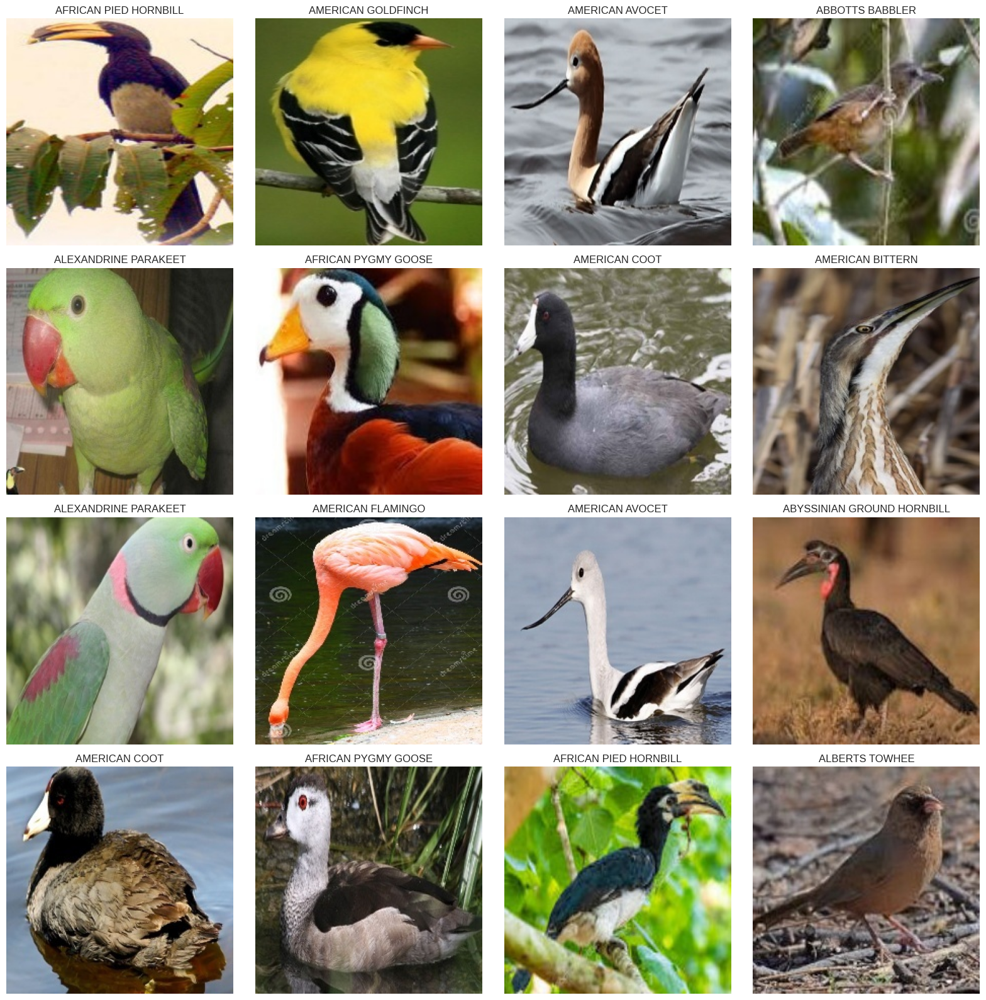

In [5]:
fig, ax = plt.subplots(4, 4, figsize=(16, 16))

for i in range(4):
    for j in range(4):
        index = i * 4 + j
        img = mpimg.imread(combined_df['filename'][index])
        ax[i, j].imshow(img)
        ax[i, j].axis('off')
        ax[i, j].set_title(combined_df['outcome'][index])

plt.tight_layout()
plt.show()

## Dataset Distribution
plot the distribution of the dataset, both training and validation set

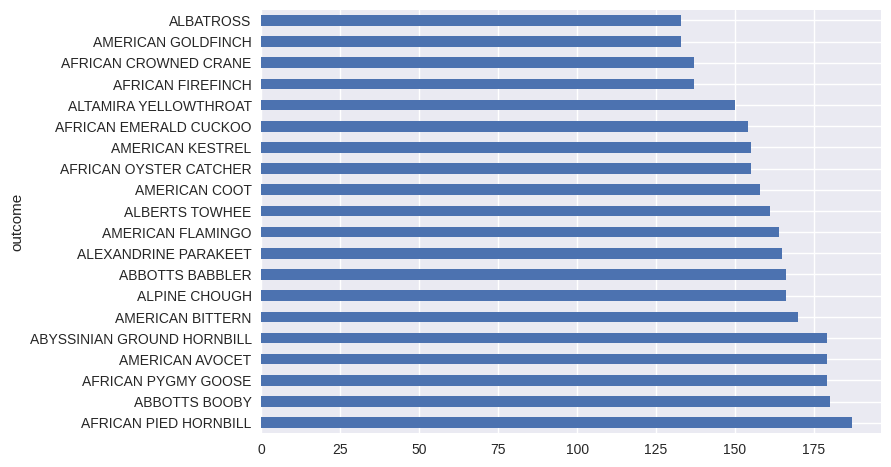

In [6]:
#Plot the distribution of classes
train_df['outcome'].value_counts().plot(kind='barh')
plt.show()

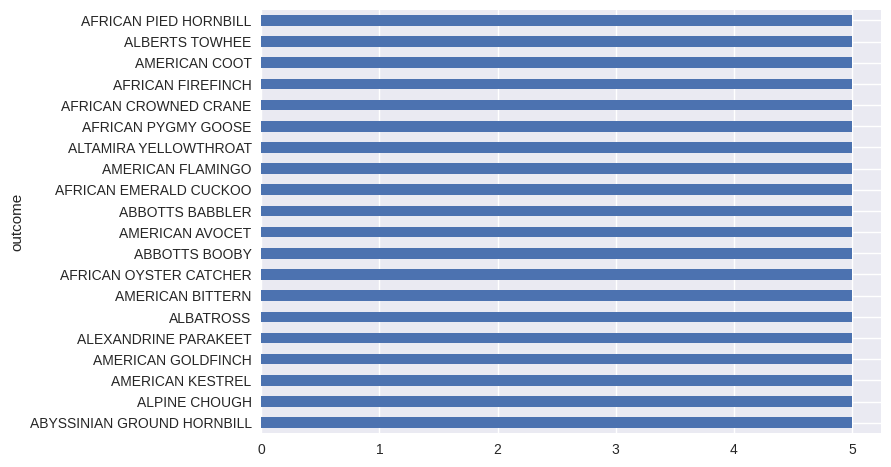

In [7]:
val_df['outcome'].value_counts().plot(kind='barh')
plt.show()

## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [8]:
class BirdDataset:
    def __init__(self, df, transform = None):
        #Initialize the needed data
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # Load and transform an image
        img = plt.imread(self.df.iloc[idx, 0])
        if self.transform:
            img = self.transform(img)
        return img


# Apply preprocessings on the image dataset (increasing saturation, ...) by using transforms.ColorJitter for example.
train_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((160, 160)),
    transforms.ColorJitter(saturation=0.5),
    transforms.Normalize(mean = 0, std = 1),
    transforms.RandomHorizontalFlip(p = 0.5)
])

val_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((160, 160)),
    transforms.Normalize(mean = 0, std = 1)
])

# Define transforms and datasets and data loaders
train_dataset = BirdDataset(train_df, transform=train_transform)
val_dataset = BirdDataset(val_df, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered

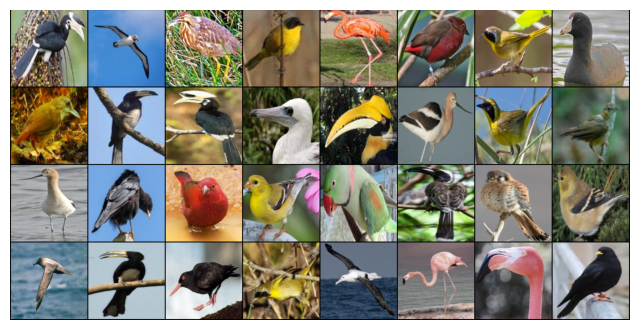

In [9]:
def imshow(img):
    np_img = img.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)))
    plt.axis('off')
    plt.show()

# show some training images with shuffle=False and labels
for i, data in enumerate(train_loader, 0):
    imshow(torchvision.utils.make_grid(data[:32]))
    if i == 0:
        break

**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

Because it helps address challenges such as overfitting, limited data availability, and model generalization. By artificially expanding the training dataset with diverse transformations, data augmentation enables the model to learn more robust features and generalize better to unseen data. In this task, resizing, flipping, cropping, changing saturation and so on can be beneficial.

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import torchvision.models as models
from torchvision import transforms
import torch.nn.functional as F

# Perceptual loss implementation
class PerceptualLoss(nn.Module):
    def __init__(self, feature_layers={1: 0.2, 3: 0.2, 6: 0.1, 8: 0.025, 13: 0.025}, use_half=False):
        super(PerceptualLoss, self).__init__()
        self.feature_layers = feature_layers
        self.vgg = models.vgg16(pretrained=True).features
        for param in self.vgg.parameters():
            param.requires_grad = False
        self.use_half = use_half
        self.vgg.to(device)
        self.vgg.eval()

    def forward(self, x, y):
        if self.use_half:
            x, y = x.half(), y.half()

        loss = 2.0 * F.mse_loss(x, y)
        x, y = x.expand(-1, 3, -1, -1), y.expand(-1, 3, -1, -1)

        for i, layer in enumerate(self.vgg):
            x, y = layer(x), layer(y)
            if i in self.feature_layers:
                loss += F.mse_loss(x, y) * self.feature_layers[i]
        return loss

# Encoder definition
class Encoder(nn.Module):
    def __init__(self, do_bn=False, num_layers=4, first_layer_size=32):
        super(Encoder, self).__init__()
        self.do_bn = do_bn
        self.num_layers = num_layers
        self.inner_blocks = nn.ModuleList()

        cur_size = first_layer_size
        for i in range(num_layers):
            if i == 0:
                self.inner_blocks.append(self._inner_block(1, cur_size, maxpool=2))
            else:
                self.inner_blocks.append(self._inner_block(cur_size, cur_size * 2, maxpool=2))
                cur_size *= 2

    def _inner_block(self, in_c, out_c, maxpool=2):
        return nn.Sequential(
            nn.Conv2d(in_c, out_c, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.ReLU(),
            nn.MaxPool2d(maxpool),
            nn.Dropout(0.2),
            nn.Conv2d(out_c, out_c, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.ReLU(),
            nn.Dropout(0.1)
        )

    def forward(self, x, layer):
        return self.inner_blocks[layer](x)

# Decoder definition
class Decoder(nn.Module):
    def __init__(self, do_bn, num_layers=4, first_layer_c=256, output_c=3):
        super(Decoder, self).__init__()
        self.do_bn = do_bn
        self.num_layers = num_layers
        self.first_layer_c = first_layer_c
        self.output_c = output_c

        self.inner_blocks = nn.ModuleList()
        self.conv_blocks = nn.ModuleList()

        cur_size = first_layer_c
        for i in range(num_layers - 1):
            self.inner_blocks.append(self._inner_block(cur_size, cur_size // 2))
            self.conv_blocks.append(self._conv_block(cur_size, cur_size // 2))
            cur_size //= 2
        self.inner_blocks.append(self._inner_block(cur_size, output_c, out=True))

    def _inner_block(self, in_c, out_c, out=False):
        return nn.Sequential(
            nn.ConvTranspose2d(in_c, out_c, kernel_size=3, stride=1, padding=1, bias=False),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.LeakyReLU(),
            nn.Dropout(0.1),
            nn.Conv2d(out_c, out_c, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU() if not out else nn.Sigmoid(),
            nn.Dropout(0.2) if not out else nn.Identity(),
        )

    def _conv_block(self, in_c, out_c):
        return nn.Sequential(
            nn.Conv2d(in_c, out_c, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.ReLU(),
            nn.Dropout(0.1)
        )

    def forward(self, x, layer, h=None):
        x = self.inner_blocks[layer](x)
        if h is not None:
            x = torch.cat([x, h], dim=1)
            x = self.conv_blocks[layer](x)
        return x

# Main network combining encoder, decoder, and perceptual loss
class Net(nn.Module):
    def __init__(self, lr=1e-3, do_bn=True, use_perceptual_loss=True, num_layers=4, first_layer_size=32):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn=do_bn, num_layers=num_layers, first_layer_size=first_layer_size)
        self.decoder = Decoder(do_bn=do_bn, num_layers=num_layers, first_layer_c=first_layer_size * (1 << (num_layers - 1)), output_c=3)
        self.lr = lr
        self.use_perceptual_loss = use_perceptual_loss
        self.train_loss = []
        self.val_loss = []
        self.cur_train_loss = []
        self.cur_val_loss = []
        self.gray_transform = transforms.Grayscale(num_output_channels=1)
        self.optimizer = optim.Adam(self.parameters(), lr=self.lr)

        if self.use_perceptual_loss:
            self.criterion = PerceptualLoss()
        else:
            self.criterion = nn.MSELoss()
        self.criterion.to(device)

    def forward(self, x):
        x = self.gray_transform(x)
        h = []
        for i in range(self.encoder.num_layers):
            x = self.encoder(x, i)
            h.append(x)
        x = h[-1]
        for i in range(self.decoder.num_layers - 1):
            x = self.decoder(x, i, h[-i-2])
        x = self.decoder(x, self.decoder.num_layers - 1)
        return x

    def compute_loss(self, pred, target):
        return self.criterion(pred, target)

    def training_step(self, X):
        self.optimizer.zero_grad()
        pred = self.forward(X)
        loss = self.compute_loss(pred, X)
        self.cur_train_loss.append(loss.item())
        loss.backward()
        self.optimizer.step()

    def validation_step(self, X):
        with torch.no_grad():
            pred = self.forward(X)
            loss = self.compute_loss(pred, X)
            self.cur_val_loss.append(loss.item())

    def train(self, epochs=10):
        for epoch in range(epochs):
            self.cur_train_loss = []
            self.cur_val_loss = []
            print(f"Epoch: {epoch + 1}")
            self._train_epoch(epoch)
            self._validate_epoch(epoch)

    def _train_epoch(self, epoch):
        progress_bar = tqdm(enumerate(train_loader), total=len(train_loader))
        running_loss = 0.0
        for i, data in progress_bar:
            X = data.to(device)
            self.training_step(X)
            running_loss += self.cur_train_loss[-1]
            progress_bar.set_description(f'Epoch: {epoch + 1}, Loss: {running_loss / (i + 1):.5f}')
        avg_train_loss = sum(self.cur_train_loss) / len(self.cur_train_loss)
        print(f'Training Loss: {avg_train_loss}')
        self.train_loss.append(avg_train_loss)

    def _validate_epoch(self, epoch):
        for i, data in enumerate(val_loader):
            X = data.to(device)
            self.validation_step(X)
        avg_val_loss = sum(self.cur_val_loss) / len(self.cur_val_loss)
        print(f'Validation Loss: {avg_val_loss}\n')
        self.val_loss.append(avg_val_loss)

In [11]:
model = Net(lr=1e-4, num_layers=5, first_layer_size=32)
model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 198MB/s]  


Net(
  (encoder): Encoder(
    (inner_blocks): ModuleList(
      (0): Sequential(
        (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): Dropout(p=0.2, inplace=False)
        (5): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (6): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (7): ReLU()
        (8): Dropout(p=0.1, inplace=False)
      )
      (1): Sequential(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): D

## Training Phase

In [12]:
# Train
# Students should implement the training loop. During training, monitor both training and validation metrics
# to ensure the model learns effectively without overfitting.
model.train(epochs=50)

Epoch: 1


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.26971739619085106



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.2394838109612465

Epoch: 2


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.2193672906349201



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.20768465101718903

Epoch: 3


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.18855503939165927



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.1797308474779129

Epoch: 4


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.16297885037884854



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.15805090218782425

Epoch: 5


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.14383094337317023



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.1434694416821003

Epoch: 6


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.13021353838762434



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.1323441080749035

Epoch: 7


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.12098947632135731



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.1252526119351387

Epoch: 8


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.11464184861962158



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.11929836869239807

Epoch: 9


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.10997303508886017



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.11497330851852894

Epoch: 10


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.10620650803983801



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.11187596991658211

Epoch: 11


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.10239788152203702



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.10870500467717648

Epoch: 12


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.10020865920451608



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.10668864287436008

Epoch: 13


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.09797341738006857



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.10461841337382793

Epoch: 14


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.09574831845146595



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.10323088988661766

Epoch: 15


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.09428336847536635



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.10164460726082325

Epoch: 16


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.0924100096125414



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.10073811560869217

Epoch: 17


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.09171577233194124



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09938396327197552

Epoch: 18


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered

Training Loss: 0.09060073784082243



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09871219843626022

Epoch: 19


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08973957435919507



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.0979812927544117

Epoch: 20


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08893765420606821



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09737284854054451

Epoch: 21


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08833297674018557



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09659132175147533

Epoch: 22


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08704648587373223



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09587610140442848

Epoch: 23


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08723821254945037



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.0953969769179821

Epoch: 24


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08582073560740688



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09461324475705624

Epoch: 25


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08591111174019256



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.0942292120307684

Epoch: 26


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08469766297257773



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.0938861295580864

Epoch: 27


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08497661905418528



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09355593472719193

Epoch: 28


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08386292374960266



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.0932152010500431

Epoch: 29


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08308739938063196



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09267709776759148

Epoch: 30


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08271860574731732



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09267121739685535

Epoch: 31


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08250000689289358



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09216315485537052

Epoch: 32


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08262004585254311



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09136233292520046

Epoch: 33


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08169817813847324



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09155978076159954

Epoch: 34


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered

Training Loss: 0.08141902738278455



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09084253944456577

Epoch: 35


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08097092069611692



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.090618085116148

Epoch: 36


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08073434108259654



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.0904929731041193

Epoch: 37


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08040615724455012



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.09005218930542469

Epoch: 38


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.0803907280511195



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08978402800858021

Epoch: 39


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.08061293128988531



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08946630544960499

Epoch: 40


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.07980124740907461



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08931677043437958

Epoch: 41


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.07990529093116817



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08914166316390038

Epoch: 42


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered

Training Loss: 0.07966868549880415



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.0885796770453453

Epoch: 43


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.0792744427476779



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08868667110800743

Epoch: 44


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.07823383918788174



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08823142945766449

Epoch: 45


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.07854993700390996



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08769908733665943

Epoch: 46


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.07864747137421428



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08754339069128036

Epoch: 47


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.07897252213246751



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08726134896278381

Epoch: 48


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.07796251832848729



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08745325915515423

Epoch: 49


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.07774914424903322



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.08673050254583359

Epoch: 50


  0%|          | 0/101 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

Training Loss: 0.07743176961741825



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggere

Validation Loss: 0.0869192648679018



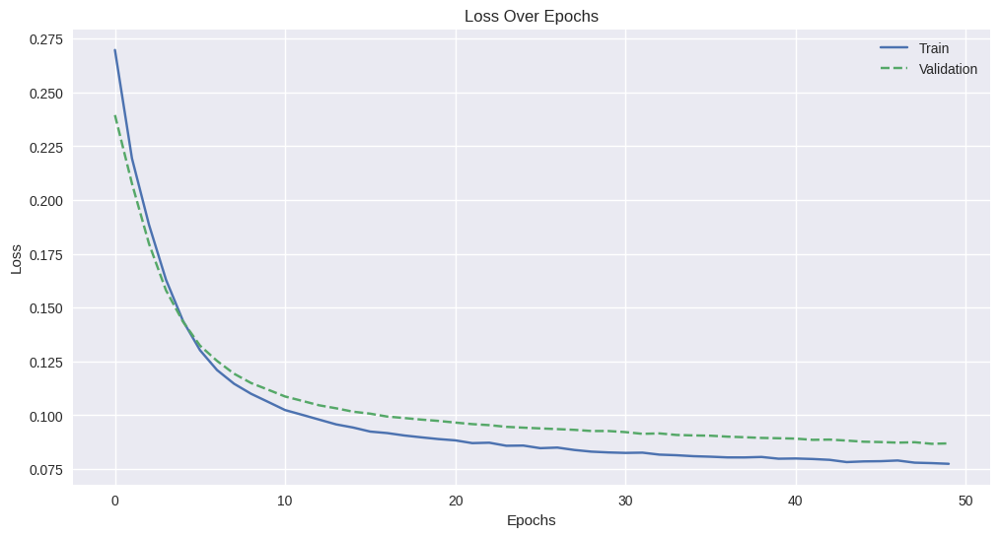

In [13]:
# TODO: Plot training and validation loss over epochs
plt.figure(figsize=(12, 6))
plt.plot(model.train_loss, label='Train', linestyle='-')
plt.plot(model.val_loss, label='Validation', linestyle='--')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Over Epochs')
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()


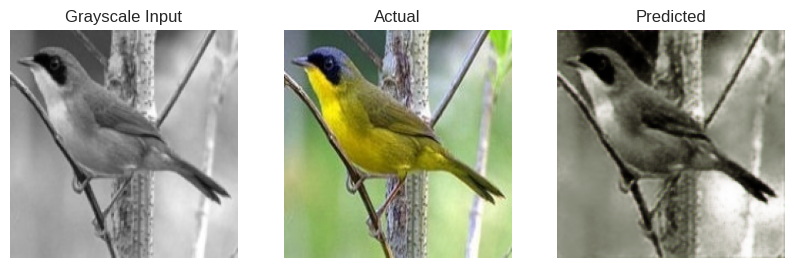

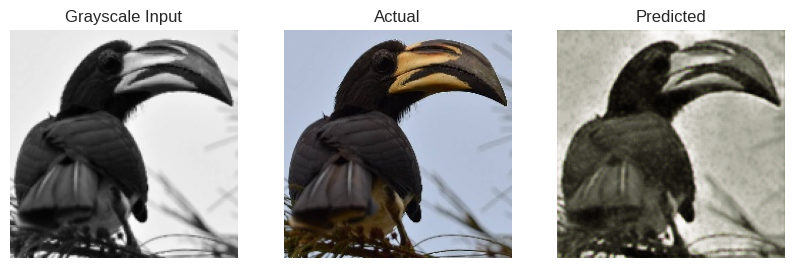

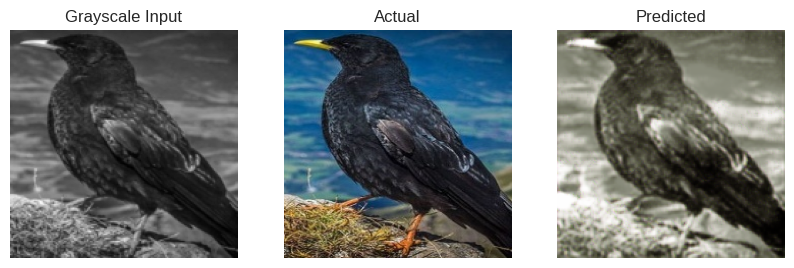

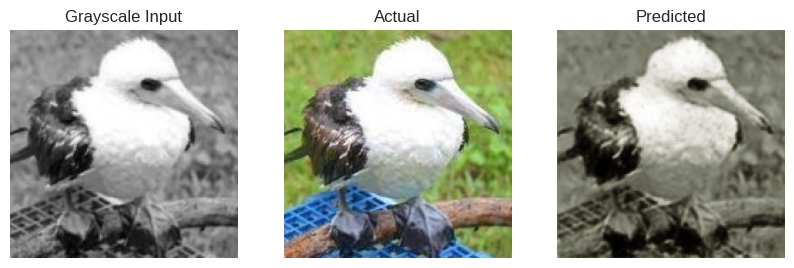

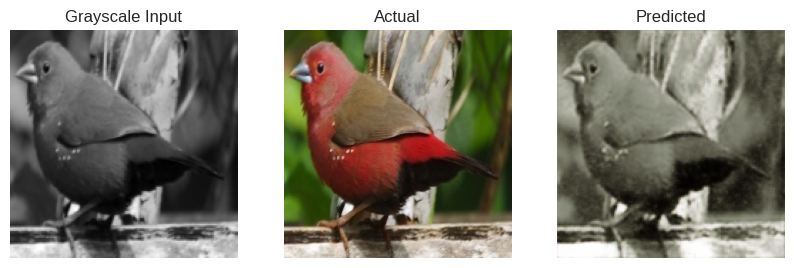

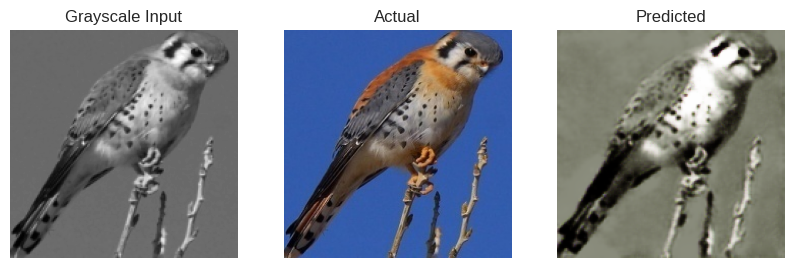

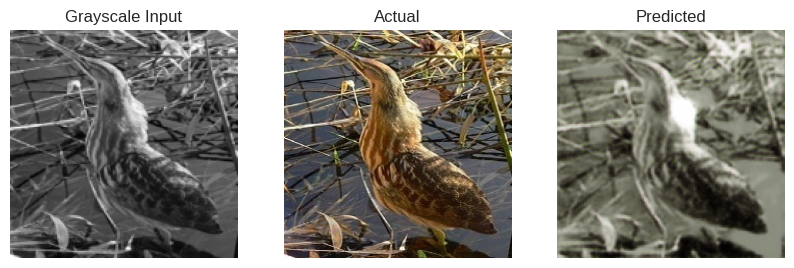

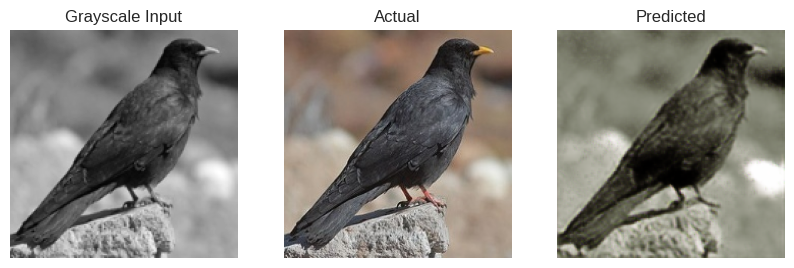

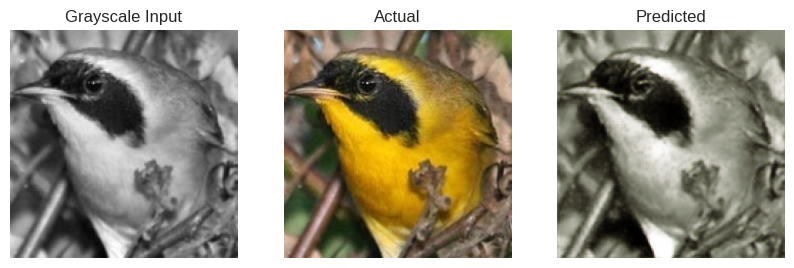

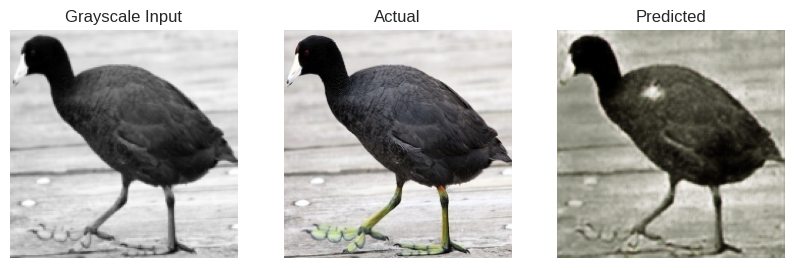

In [14]:
# TODO: Plot grayscale, actual, and predicted inputs
def plot_images(img, x_img, pred):
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 3, 1)
    plt.title('Grayscale Input')
    plt.imshow(x_img[0][0].detach().numpy(), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Actual')
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Predicted')
    plt.imshow(pred.detach().numpy())
    plt.axis('off')

    plt.show()

for img_file in val_df.sample(n=10)['filename']:
    img = plt.imread(img_file)[:, :, :3]
    x_img = model.gray_transform(val_transform(img)).view(-1, 1, 160, 160)
    model = model.to('cpu')
    with torch.no_grad():
        pred = model(x_img)[0]
        pred = torch.einsum('ijk->jki', pred)
    plot_images(img, x_img, pred)

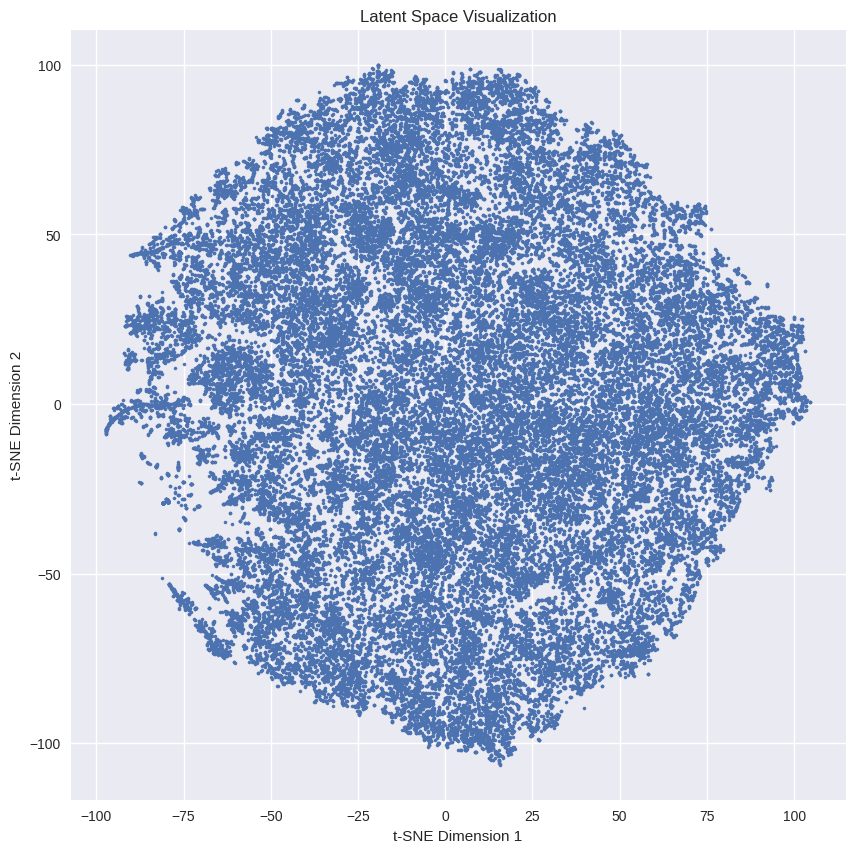

In [15]:
# Visualizing the Latent Space
# Latent space visualizations are a powerful tool to understand how the VAE encodes data.
# In this task, students are required to implement a visualization routine to observe the distribution of their data within the latent space.
# The goal is to project high-dimensional encoded data into two dimensions using t-SNE and inspect how different data points are clustered.

from sklearn.manifold import TSNE

# Function to visualize the latent space
def visualize_latent_space(encoder, data_loader, num_samples=1000):
    """
    Uses a 2-dimensional t-SNE plot to visualize latent space of encoded images.
    
    # TODO: Implement a loop to encode a batch of images and collect their latent representations.
    # TODO: Use t-SNE to reduce dimensions of these latent representations for visualization.

    Parameters:
    encoder (torch.nn.Module): The encoder model component of the VAE.
    data_loader (torch.utils.data.DataLoader)
    num_samples (int): Number of samples to visualize
    """
    # - Set model to evaluation mode
    encoder.eval()

    # - Limit the number of samples based on the user's preference
    num_samples = min(num_samples, len(data_loader.dataset))

    # - Move images to the same device as model
    device = next(encoder.parameters()).device

    # TODO: Use the encoder to get the mean (mu) of the latent distribution
    latent_vectors = []
    for i, data in enumerate(data_loader):
        images = data.to(device)
        x = model.gray_transform(images)
        for i in range(5):
            x = model.encoder(x, i)
        for u in range(x.shape[0]):
            latent_vectors.append(x[u].view(x[u].size(0) , -1))
        if len(latent_vectors) * data_loader.batch_size >= num_samples:
            break
       
    # - Stack all obtained latent vectors
    latent_vectors = torch.cat(latent_vectors, dim=0).detach().cpu().numpy()
    
    # - t-SNE reduction to 2D for visualization
    tsne = TSNE(n_components=2, random_state=0)
    latent_vectors_2d = tsne.fit_transform(latent_vectors)
    
    # - Plotting the 2D projection
    plt.figure(figsize=(10, 10))
    plt.scatter(latent_vectors_2d[:, 0], latent_vectors_2d[:, 1], s=5)
    plt.title('Latent Space Visualization')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.show()
    
# TODO: Use visualize_latent_space function post-training to observe the latent space
visualize_latent_space(model.encoder, train_loader, num_samples=3208)

How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
  
       Since the latent space is a filled circle, it means the points are smoothly distributed, not in distinct clusters. This suggests the model represents data continuously, without clear boundaries between features or categories.

    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?
  
       If there were clusters in the latent space, it would show that the VAE can differentiate between different color patterns. Clusters would group similar color features together. Since the space is a filled circle, it means the model represents color variations more smoothly and continuously, rather than separating them into distinct categories.

3. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
  
  
        They result in similar color outputs. it shows that the latent space is smooth and continuous. This means small changes in the latent variables lead to subtle, coherent color variations. A smooth latent space allows the model to generate a range of realistic colorizations with gradual transitions. If neighboring points produce very different color outputs, it suggests the latent space might not be smooth, and the model could be struggling to learn a consistent mapping. Ideally, nearby points should lead to similar color outputs, showing good generalization.
      
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?
  
        Smooth transitions in the latent space help the model generate realistic colorizations for images with gradual changes, like lighting or shading. Small shifts in the latent variables lead to consistent color changes, matching the natural transitions in the image. This makes the colorization more realistic and visually smooth. If the latent space is not smooth, the colorization might have unnatural jumps, reducing quality and realism.

4. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?
  
      t-SNE is useful for visualizing high-dimensional data in 2D, helping us see patterns and clusters in the latent space. It does well at showing how similar points are to each other. However, it can distort the overall structure, so the distances between points might not be accurate. The axes in t-SNE plots don’t have real meaning, making it hard to compare points directly. Also, t-SNE is sensitive to settings like perplexity, which can affect the results. While it shows local patterns well, it doesn't always capture the global relationships, so it's best to use it alongside other methods for a fuller understanding.


Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

The encoder-decoder architecture enables the model to learn complex data distributions by first encoding the grayscale image into a compact latent representation that captures essential high-level features like textures and shapes. The decoder then reconstructs the image, adding realistic color information based on the encoded features. This process helps the model understand the context and structure of the image, allowing it to generate accurate colorized outputs. In contrast, a simple autoencoder focuses on data reconstruction, aiming to recreate the input image exactly without introducing new features like color. While an autoencoder learns to map input to output without changing its nature, the encoder-decoder model for colorization is specifically designed to learn the mapping from grayscale to color, capturing complex relationships between visual features and their corresponding colors. Therefore, the encoder-decoder architecture is more suitable for tasks like image colorization, where the goal is to add new information to the image.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

Unlike traditional pixel-wise losses, such as MSE, which measure image similarity by comparing pixel values, perceptual loss operates at a higher level by comparing feature representations extracted from pre-trained deep neural networks, such as VGG. This allows perceptual loss to evaluate the overall content, texture, and structure of the image rather than just pixel-level accuracy. Thus, it leads to generate images perceptually similar to real, naturally colored ones, even if pixel-wise differences remain.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

If the latent space is too small, the model may lack the capacity to capture complex details, resulting in blurry or unnatural images with limited diversity. On the other hand, a larger latent space allows the model to represent more nuanced variations, improving the fidelity and increasing the diversity of generated images by offering a wider range of colorizations. However, excessively large latent spaces can lead to overfitting.

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [13]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
...
print ('modules loaded')

modules loaded


## Load the Dataset

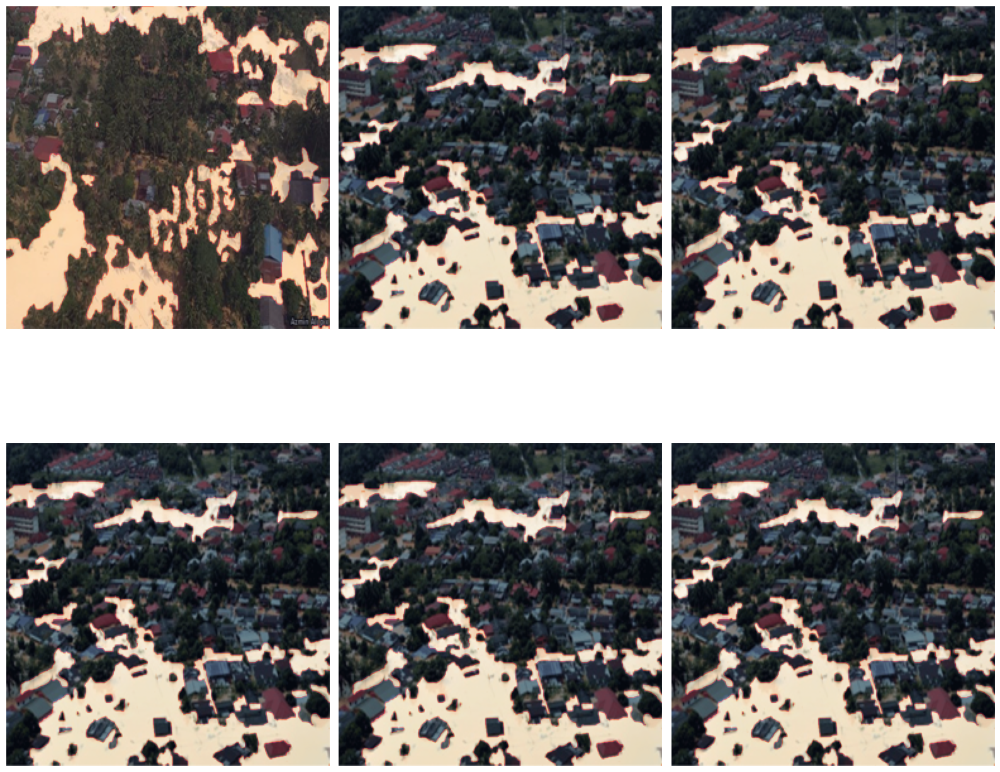

In [14]:
def create_data(data_dir):
    """
    TODO: Traverse through the given data directory to extract and return paths to images and masks.
    - Identify relevant folders for images and masks.
    - Collect file paths from these folders and return them as lists.
    """
    image_dir = os.path.join(data_dir, '/kaggle/input/seg-data/Image-20241223T020348Z-001/Image')
    mask_dir = os.path.join(data_dir, '/kaggle/input/seg-data/Mask-20241223T020345Z-001/Mask')
    image_paths = sorted(glob.glob(os.path.join(image_dir, '*')), key=lambda x: os.path.basename(x))
    mask_paths = sorted(glob.glob(os.path.join(mask_dir, '*')), key=lambda x: os.path.basename(x))
    return image_paths, mask_paths


def load_image(image, SIZE):
    """
    TODO: Load and resize an individual image to the specified size, scaling pixel values appropriately.
    - Convert image to array and normalize pixel values.
    - Use resizing techniques to ensure uniform image dimensions.
    """
    img = PIL.Image.open(image).convert('RGB')
    img = img.resize((SIZE, SIZE))
    img = np.array(img) / 255.0
    return img

def load_mask(mask, SIZE):
    mask = PIL.Image.open(mask).convert('L')
    mask = mask.resize((SIZE, SIZE))
    mask = np.array(mask) / 255.0
    return mask

def load_images(image_paths, SIZE, mask=False, trim=None):
    """
    TODO: Batch process a list of image paths, loading and organizing images into a numpy array.
    - Handle both image and mask files optionally, managing different channel dimensions.
    - Optionally trim the list of images to handle a subset of data.
    """
    images = []
    for i, path in enumerate(image_paths):
        if i == trim:
            break
        if mask:
            img = load_mask(path, SIZE)
        else:
            img = load_image(path, SIZE)
        images.append(img)
    images = np.array(images)
    return images

def show_image(image, title=None, cmap=None, alpha=1):
    """
    TODO: Display a single image using matplotlib with options for color map and transparency.
    - Ensure axes are turned off for a cleaner display.
    - Include optional title for context.
    """
    plt.imshow(image, cmap=cmap, alpha=alpha)
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()

def show_mask(image, mask, cmap=None, alpha=0.4):
    """
    TODO: Overlay a mask on an image to visualize segmentation results.
    - Use transparency to allow both mask and image to be visible.
    - Include color mapping to differentiate mask areas.
    """
    plt.imshow(image, cmap=cmap, alpha=alpha)
    plt.imshow(mask, cmap=cmap, alpha=alpha)
    plt.axis('off')
    plt.show()

def show_images(imgs, msks):
    """
    TODO: Display multiple image-mask pairs to examine the dataset distribution.
    - Randomly select sample pairs of images and masks for visualization.
    - Use subplots to arrange visuals neatly and use tight layout for optimization.
    """
    fig, axs = plt.subplots(2, 3, figsize=(16, 16))
    for i in range(2):
        for j in range(3):
            idx = np.random.randint(0, len(imgs))
            axs[i, j].imshow(imgs[idx])
            axs[i, j].imshow(msks[idx], alpha=0.5)
            axs[i, j].axis('off')

    fig.tight_layout()
    plt.show()

SIZE = 256

# TODO: Load and visualize images
image_paths, mask_paths = create_data('/kaggle/input/seg-data')
imgs = load_images(image_paths, SIZE, trim=2)
msks = load_images(mask_paths, SIZE, trim=2, mask=True)
show_images(imgs, msks)

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [21]:
# Enhancing U-Net with Dice and Jaccard Losses for Segmentation

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Dice coefficient loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        return 1 - (2.0 * (pred * target).sum() + self.smooth) / (pred.sum() + target.sum() + self.smooth)


class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Jaccard (IoU) loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum() - intersection
        return 1 - (intersection + self.smooth) / (union + self.smooth)


class AttentionGate(nn.Module):
    def __init__(self, F_l, F_int, F_g):
        super(AttentionGate, self).__init__()
        self.W_x = nn.Conv2d(F_l, F_int, kernel_size=1, stride=2)
        self.W_g = nn.Conv2d(F_g, F_int, kernel_size=1, stride=1)
        self.psi = nn.Conv2d(F_int, 1, kernel_size=1, stride=1)
        self.relu = nn.ReLU()

    def forward(self, x, g):
        x1 = self.W_x(x)
        g1 = self.W_g(g)
        psi = self.relu(x1 + g1)
        psi = self.psi(psi)
        psi = torch.sigmoid(psi)

        psi = nn.functional.interpolate(psi, size=x.size()[2:], mode='bilinear', align_corners=True)

        return x * psi

class EncoderBlock(nn.Module):
    def __init__(self, in_ch, out_ch, dropout_prob=0):
        super(EncoderBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(out_ch)
        )
        self.dropout_prob = dropout_prob

    def forward(self, x):
        x = self.conv(x)
        if self.dropout_prob > 0:
            x = nn.functional.dropout2d(x, p=self.dropout_prob)
        return x


class DecoderBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(DecoderBlock, self).__init__()
        self.up = nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2)
        self.conv = EncoderBlock(in_ch=out_ch * 2, out_ch=out_ch)
        self.attention = AttentionGate(F_l=out_ch, F_int=out_ch, F_g=in_ch)

    def forward(self, x, x_att):
        x_up = self.up(x)
        x_att = self.attention(x_att, x)
        x = torch.cat([x_up, x_att], dim=1)
        x = self.conv(x)
        return x


class UNetModel(nn.Module):
    def __init__(self):
        super(UNetModel, self).__init__()
        # TODO: Define encoder, decoder blocks, and output layer.
        self.pool = nn.MaxPool2d(2, 2)

        # Down-sampling
        self.conv_block1 = EncoderBlock(3, 32)
        self.conv_block2 = EncoderBlock(32, 64)
        self.conv_block3 = EncoderBlock(64, 128)
        self.conv_block4 = EncoderBlock(128, 256, dropout_prob=0.3)

        # Bottleneck
        self.bottleneck = EncoderBlock(256, 512, dropout_prob=0.3)

        # Up-sampling and final layer
        self.up_block1 = DecoderBlock(512, 256)
        self.up_block2 = DecoderBlock(256, 128)
        self.up_block3 = DecoderBlock(128, 64)
        self.up_block4 = DecoderBlock(64, 32)

        self.final_conv = nn.Conv2d(32, 1, kernel_size=1)

        self.dice_loss = DiceLoss()
        self.jaccard_loss = JaccardLoss()

    def forward(self, x):
        c1 = self.conv_block1(x)
        p1 = self.pool(c1)
        c2 = self.conv_block2(p1)
        p2 = self.pool(c2)
        c3 = self.conv_block3(p2)
        p3 = self.pool(c3)
        c4 = self.conv_block4(p3)
        p4 = self.pool(c4)

        bottleneck = self.bottleneck(p4)

        up1 = self.up_block1(bottleneck, c4)
        up2 = self.up_block2(up1, c3)
        up3 = self.up_block3(up2, c2)
        up4 = self.up_block4(up3, c1)

        out = self.final_conv(up4)

        return out


    def compute_loss(self, pred, target):
        """
        Calculate the combined segmentation loss using Dice and Jaccard losses.
        - pred: predicted probability maps
        - target: ground truth probability maps
        """
        pred = torch.sigmoid(pred)
        target = target.float()
        dice_loss = self.dice_loss(pred, target)
        jaccard_loss = self.jaccard_loss(pred, target)
        return dice_loss + jaccard_loss

# Model instantiation
model = UNetModel()

## Training

In [22]:
# TODOL:
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
# set batch size for training
batch_size = 32
# number of all epochs in training
epochs = 100
# number of epochs to run before asking if you want to halt training
class UNetDataset(Dataset):
    def __init__(self, images, masks, transform=transforms.ToTensor()):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = load_image(self.images[idx], 224)
        mask = load_mask(self.masks[idx], 224)
        image = self.transform(image.astype(np.float32))
        mask = self.transform(mask.astype(np.float32))
        return image, mask

images, masks = create_data('/kaggle/input/seg-data')
train_images, val_images, train_masks, val_masks = train_test_split(images, masks, test_size=0.2, random_state=42)
train_dataset = UNetDataset(train_images, train_masks)
val_dataset = UNetDataset(val_images, val_masks)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

model.to(device)
train_losses = []
val_losses = []
# Training
for epoch in range(epochs):
    train_loss = 0.0
    val_loss = 0.0
    model.train()

    for i, (inputs, masks) in tqdm(enumerate(train_loader), total=len(train_loader), desc='Training'):
        inputs, masks = inputs.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = model.compute_loss(outputs, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    train_loss /= len(train_loader)
    train_losses.append(train_loss)
    print(f'Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}')

    model.eval()
    with torch.no_grad():
        for i, (inputs, masks) in tqdm(enumerate(val_loader), total=len(val_loader), desc='Evaluate'):
            inputs, masks = inputs.to(device), masks.to(device)
            outputs = model(inputs)
            loss = model.compute_loss(outputs, masks)
            val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        print(f'Validation Loss: {val_loss:.4f}')

Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 1/100, Train Loss: 1.0530


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 1.2349


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 2/100, Train Loss: 0.8689


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 1.1835


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 3/100, Train Loss: 0.7577


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 1.1046


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 4/100, Train Loss: 0.6780


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 1.0449


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 5/100, Train Loss: 0.6394


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 1.0255


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 6/100, Train Loss: 0.5840


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.7823


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 7/100, Train Loss: 0.5759


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.6454


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 8/100, Train Loss: 0.5528


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5787


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 9/100, Train Loss: 0.5207


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5665


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 10/100, Train Loss: 0.5383


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5557


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 11/100, Train Loss: 0.4927


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5368


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 12/100, Train Loss: 0.4952


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5131


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 13/100, Train Loss: 0.4720


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5033


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 14/100, Train Loss: 0.4610


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5114


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 15/100, Train Loss: 0.4819


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5151


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 16/100, Train Loss: 0.4585


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4934


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 17/100, Train Loss: 0.4235


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4891


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 18/100, Train Loss: 0.4247


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5032


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 19/100, Train Loss: 0.4079


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5001


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4043


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4970


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 21/100, Train Loss: 0.3927


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4937


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 22/100, Train Loss: 0.4249


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.5023


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 23/100, Train Loss: 0.3917


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4790


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 24/100, Train Loss: 0.3965


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4853


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 25/100, Train Loss: 0.3772


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4683


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 26/100, Train Loss: 0.3832


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4794


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 27/100, Train Loss: 0.3634


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4876


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 28/100, Train Loss: 0.3583


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4739


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 29/100, Train Loss: 0.3542


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4628


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 30/100, Train Loss: 0.3443


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4647


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 31/100, Train Loss: 0.3667


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4676


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 32/100, Train Loss: 0.3637


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4676


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 33/100, Train Loss: 0.3815


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4570


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 34/100, Train Loss: 0.3319


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4593


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 35/100, Train Loss: 0.3238


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4978


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 36/100, Train Loss: 0.3283


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4513


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 37/100, Train Loss: 0.3288


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4612


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 38/100, Train Loss: 0.3208


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4372


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 39/100, Train Loss: 0.3047


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4568


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 40/100, Train Loss: 0.3000


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4598


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 41/100, Train Loss: 0.2933


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4304


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 42/100, Train Loss: 0.3168


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4351


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 43/100, Train Loss: 0.2987


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4623


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 44/100, Train Loss: 0.3181


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4532


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 45/100, Train Loss: 0.2873


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4379


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 46/100, Train Loss: 0.2860


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4404


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 47/100, Train Loss: 0.3071


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4323


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 48/100, Train Loss: 0.2842


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4251


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 49/100, Train Loss: 0.2710


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4312


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 50/100, Train Loss: 0.2693


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4455


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 51/100, Train Loss: 0.2711


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4270


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 52/100, Train Loss: 0.2861


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4342


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 53/100, Train Loss: 0.2875


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4314


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 54/100, Train Loss: 0.2898


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4211


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 55/100, Train Loss: 0.2653


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4123


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 56/100, Train Loss: 0.2567


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4242


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 57/100, Train Loss: 0.2656


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4137


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 58/100, Train Loss: 0.2366


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4044


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 59/100, Train Loss: 0.2390


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4158


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 60/100, Train Loss: 0.2401


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4340


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 61/100, Train Loss: 0.2438


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4195


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 62/100, Train Loss: 0.2408


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4174


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 63/100, Train Loss: 0.2338


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4327


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 64/100, Train Loss: 0.2405


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4264


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 65/100, Train Loss: 0.2311


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4243


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 66/100, Train Loss: 0.2526


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4281


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 67/100, Train Loss: 0.2408


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4187


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 68/100, Train Loss: 0.2455


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4208


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 69/100, Train Loss: 0.2367


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4195


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 70/100, Train Loss: 0.2374


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4228


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 71/100, Train Loss: 0.2225


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4176


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 72/100, Train Loss: 0.2297


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4146


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 73/100, Train Loss: 0.2221


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4224


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 74/100, Train Loss: 0.2110


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4157


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 75/100, Train Loss: 0.2205


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4168


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 76/100, Train Loss: 0.2056


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4069


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 77/100, Train Loss: 0.2045


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4169


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 78/100, Train Loss: 0.2327


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4238


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 79/100, Train Loss: 0.2153


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4118


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 80/100, Train Loss: 0.2041


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4135


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 81/100, Train Loss: 0.1993


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4205


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 82/100, Train Loss: 0.1986


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4114


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 83/100, Train Loss: 0.1947


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4156


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 84/100, Train Loss: 0.1868


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4017


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 85/100, Train Loss: 0.1930


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4103


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 86/100, Train Loss: 0.2308


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4211


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 87/100, Train Loss: 0.2104


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4220


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 88/100, Train Loss: 0.2066


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4297


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 89/100, Train Loss: 0.1976


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4149


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 90/100, Train Loss: 0.2246


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4086


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 91/100, Train Loss: 0.2110


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4256


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 92/100, Train Loss: 0.1986


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4122


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 93/100, Train Loss: 0.1898


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4217


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 94/100, Train Loss: 0.1787


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4071


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 95/100, Train Loss: 0.1813


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4037


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 96/100, Train Loss: 0.1901


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4045


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 97/100, Train Loss: 0.1926


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4240


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 98/100, Train Loss: 0.1851


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4185


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 99/100, Train Loss: 0.1785


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4176


Training:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 100/100, Train Loss: 0.1827


Evaluate:   0%|          | 0/2 [00:00<?, ?it/s]

Validation Loss: 0.4208


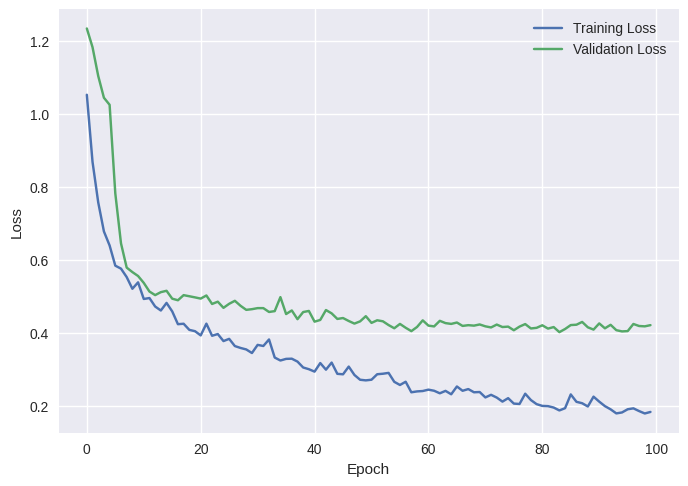

In [23]:
# TODO: Plot training and validation losses and accuracies
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Plottings

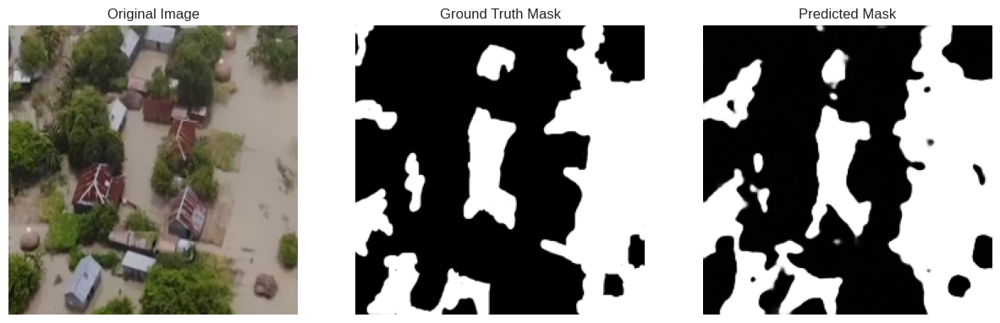

In [24]:
# Plot the original mask, the one you predicted, and the final one using a threshold
idx = np.random.randint(0, len(val_dataset))
image, mask = val_dataset[idx]
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(image.permute(1, 2, 0))
axs[0].set_title('Original Image')
axs[1].imshow(mask.squeeze(), cmap='gray')
axs[1].set_title('Ground Truth Mask')
axs[2].imshow(torch.sigmoid(model(image.unsqueeze(0).to(device))).squeeze().detach().cpu(), cmap='gray')
axs[2].set_title('Predicted Mask')
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
plt.show()

1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?

        Dice and Jaccard losses prioritize overlap between predicted and true regions, making them more robust to class imbalances by focusing on relative proportions rather than pixel counts. Cross-Entropy and MSE treat all pixels equally, making them more sensitive to imbalances unless explicitly weighted or adjusted.

    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?
  
        Dice and Jaccard losses excel in capturing spatial overlap by directly optimizing for region similarity rather than pixel-wise accuracy. They emphasize the balance between false positives and false negatives, ensuring better alignment of shapes and boundaries, particularly for imbalanced datasets where target regions may be small.
      

1. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.
  
       A low loss score for Dice and Jaccard typically indicates good model performance. These metrics reflect how well the predicted segmentation overlaps with the ground truth. A low Dice/Jaccard loss means that the intersection between the predicted and true segments is high, indicating effective segmentation. A high loss score suggests poor performance. This could be due to several factors, such as underfitting, data imbalance, or difficulty in generalizing to unseen data. A high loss score indicates that the predicted segmentation does not match well with the ground truth, which often results in lower accuracy in detecting the correct regions.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

It enhances the model's ability to focus on relevant regions by assigning higher weights to significant features while suppressing irrelevant ones. This refinement is achieved through:

Selective Focus: Attention mechanisms prioritize features corresponding to the target object, reducing confusion caused by background noise or overlapping structures.

Global-Local Context: By incorporating global context, attention allows the model to consider spatial relationships and refine predictions for fine details.

Dynamic Adaptation: Attention dynamically adjusts focus during inference, helping the model adapt to variations in cluttered scenes and segment complex boundaries effectively.
This leads to more accurate and robust segmentation, even in challenging scenarios with high visual complexity.

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?

They play a critical role in enhancing the accuracy of segmentation tasks by directly linking the encoder and decoder paths. These connections help preserve spatial information that is typically lost during the downsampling process in the encoder. By transferring high-resolution feature maps from the encoder to the decoder, skip connections ensure that fine details, such as object boundaries, are retained, which is crucial for accurate segmentation. Additionally, they enable the network to combine low-level features from the encoder with high-level semantic information from the decoder, allowing for a more comprehensive understanding of the image. This fusion of multiscale features improves the model's ability to capture complex structures. Moreover, skip connections mitigate the problem of vanishing gradients by providing shorter pathways for gradient flow, facilitating efficient training even in deeper networks.

Explain the difference between the predicted and processed mask above.

The ground truth mask represents the ideal segmentation, precisely marking flooded and non-flooded regions. In contrast, the predicted mask exhibits some inconsistencies, such as less defined boundaries and potential inaccuracies in identifying certain regions. False positives, where non-flooded areas are misclassified as flooded, and false negatives, where flooded areas are missed, can be observed in the predicted mask. Additionally, the predicted mask may show slight shape distortions and noise, such as small spurious regions that do not align with the ground truth. These discrepancies highlight challenges in achieving precise segmentation, especially in complex environments like aerial flood images, where textures and boundaries are intricate.